In [1]:
%matplotlib inline 
import json
import numpy as np
import operator
import os
import pandas
import pylab as plt
import random
from ase.data import reference_states, atomic_numbers
from sklearn.neighbors import KernelDensity
from pyiron.project import Project

/scratch/janssen/melt_al/.snakemake/conda/1cf558d9/lib/python3.9/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.neighbors.kde module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
import matplotlib as mpl
mpl.rc('font', family='Times New Roman')
plt.rcParams["mathtext.fontset"] = "stix"

In [3]:
from pyiron.thermodynamics.interfacemethod import freeze_one_half, remove_selective_dynamics, set_server, create_job_template, fix_iso, fix_z_dir, half_velocity, minimize_pos, minimize_vol, next_calc, npt_solid, npt_liquid, next_step_funct, round_temperature_next, strain_circle, analyse_minimized_structure, get_press, get_center_point, get_strain_lst, get_nve_job_name, plot_solid_liquid_ratio, ratio_selection, plot_equilibration, plot_melting_point_prediction, calc_temp_iteration, get_initial_melting_temperature_guess, validate_convergence, initialise_iterators, get_voronoi_volume, check_for_holes

In [4]:
pr = Project('melting')

In [5]:
input_file = os.path.join(pr.path, 'input.json')
output_file = os.path.join(pr.path, 'output.json')

In [6]:
# Parameters
input_file = "input.json"
output_file = "output.json"


In [7]:
pr.job_table()

""


In [8]:
if os.path.exists(input_file) and os.stat(input_file).st_size != 0:
    with open(input_file, 'r') as f:
        input_dict = json.load(f)
else:
    input_dict = {
        "config": [
            "pair_style morse 9.97749\n",
            "pair_coeff * * 0.4174 1.3885 2.845\n"
        ],
        "species": ["Al"],
        "element": "Al"
    }


In [9]:
input_dict

{'config': ['pair_style eam/fs \n', 'pair_coeff * * Al1.eam.fs Al\n'],
 'filename': './examples/fccAl/Al1.eam.fs',
 'species': ['Al'],
 'element': 'Al',
 'cpu_cores': 4}

In [10]:
pot_dict = input_dict.copy()

In [11]:
if 'model' not in pot_dict.keys():
    pot_dict['model'] = 'Lammps'
if 'name' not in pot_dict.keys():
    pot_dict['name'] = 'CustomPotential'
if 'filename' not in pot_dict.keys():
    pot_path = []
else:
    pot_path = [os.path.abspath(pot_dict['filename'])]
potential = pandas.DataFrame({'Config': [pot_dict['config']],
                             'Filename': [pot_path],
                             'Model': [pot_dict['model']],
                             'Name': [pot_dict['name']],
                             'Species': [pot_dict['species']]
                             })

In [12]:
project_parameter = {
    'project': pr,
    'run_time_steps': 50000,
    'nvt_run_time_steps': 10000,
    'nve_run_time_steps': 10000,
    'temperature_left': 0,
    'temperature_right': 1000,
    'strain_run_time_steps': 1000,
    'convergence_criterion': 1,
    'potential': potential,
    'cpu_cores': 1, 
    'job_type': pr.job_type.Lammps,
    'enable_h5md': False,
    'points': 21,
    'boundary_value': 0.25,
    'ratio_boundary': 0.25,
    'timestep_lst': [2, 2, 1],
    'fit_range_lst': [0.05, 0.01, 0.01],
    'nve_run_time_steps_lst': [25000, 20000, 50000],
    'number_of_atoms': 8000, 
}

In [13]:
for k in input_dict.keys():
    project_parameter[k] = input_dict[k]

In [14]:
if 'crystalstructure' not in project_parameter.keys():
    project_parameter['crystalstructure'] = reference_states[atomic_numbers[project_parameter['element']]]['symmetry']

In [15]:
if 'seed' not in project_parameter.keys():
    project_parameter['seed'] = random.randint(0,99999)
project_parameter['seed']

87222

In [16]:
# Values from a previous calculation can be inserted here to reproduce the results 
step_dict = {}
if os.path.exists(output_file):
    with open(output_file, 'r') as f:
        step_dict_str = json.load(f)
    for k,v in step_dict_str.items():
        step_dict[int(k)] = v
step_dict

{}

# From here on the notebook is automated - no change required !

In [17]:
step_count = 0
temperature_next = None
enable_iteration = True
convergence_goal_achieved = False

In [18]:
pr = project_parameter['project']

In [19]:
if 'lattice_constant' in project_parameter.keys():
    basis = pr.create_structure(project_parameter['element'], project_parameter['crystalstructure'].lower(), project_parameter['lattice_constant'])
elif project_parameter['crystalstructure'] == 'hcp':
    basis = pr.create_ase_bulk(project_parameter['element'], project_parameter['crystalstructure'].lower(), cubic=False)
else:
    basis = pr.create_ase_bulk(project_parameter['element'], project_parameter['crystalstructure'].lower(), cubic=True)
basis_lst = [basis.repeat([i, i, i]) for i in range(5,30)]
basis = basis_lst[np.argmin([np.abs(len(b)-project_parameter['number_of_atoms']/2) for b in basis_lst])]

In [20]:
basis.analyse_ovito_cna_adaptive()

{'CommonNeighborAnalysis.counts.OTHER': 0,
 'CommonNeighborAnalysis.counts.FCC': 4000,
 'CommonNeighborAnalysis.counts.HCP': 0,
 'CommonNeighborAnalysis.counts.BCC': 0,
 'CommonNeighborAnalysis.counts.ICO': 0}

In [21]:
basis.plot3d()

NGLWidget()

In [22]:
# pr.remove_jobs(recursive=True)

In [23]:
timestep_iter, fit_range_iter, nve_run_time_steps_iter = initialise_iterators(project_parameter)
timestep = next(timestep_iter)
fit_range = next(fit_range_iter)
nve_run_time_steps = next(nve_run_time_steps_iter)

In [24]:
pr.job_table()

""


# Step 1: set up the solid sample and roughly estimate a melting point

In [25]:
ham_minimize_pos= minimize_pos(
    structure=basis, 
    project_parameter=project_parameter
)

/scratch/janssen/melt_al/.snakemake/conda/1cf558d9/lib/python3.9/site-packages/pyiron/lammps/interactive.py:245: UserWarning: e_tol is deprecated as of vers. 0.3.0. It is not guaranteed to be in service in vers. 0.4.0. Use ionic_energy_tolerance instead.
  warnings.warn(
/scratch/janssen/melt_al/.snakemake/conda/1cf558d9/lib/python3.9/site-packages/pyiron/lammps/interactive.py:251: UserWarning: f_tol is deprecated as of vers. 0.3.0. It is not guaranteed to be in service in vers. 0.4.0. Use ionic_force_tolerance instead.
  warnings.warn(


The job minimize_pos was saved and received the ID: 1


In [26]:
ham_minimize_vol = minimize_vol(
    structure=ham_minimize_pos.get_structure(), 
    project_parameter=project_parameter
)

/scratch/janssen/melt_al/.snakemake/conda/1cf558d9/lib/python3.9/site-packages/pyiron/lammps/interactive.py:245: UserWarning: e_tol is deprecated as of vers. 0.3.0. It is not guaranteed to be in service in vers. 0.4.0. Use ionic_energy_tolerance instead.
  warnings.warn(
/scratch/janssen/melt_al/.snakemake/conda/1cf558d9/lib/python3.9/site-packages/pyiron/lammps/interactive.py:251: UserWarning: f_tol is deprecated as of vers. 0.3.0. It is not guaranteed to be in service in vers. 0.4.0. Use ionic_force_tolerance instead.
  warnings.warn(


The job minimize_vol was saved and received the ID: 2


In [27]:
temperature_next, structure_left = get_initial_melting_temperature_guess(
    project_parameter=project_parameter, 
    ham_minimize_vol=ham_minimize_vol, 
    temperature_next=temperature_next
)

The job temp_heating_1000 was saved and received the ID: 3


The job temp_heating_500_0 was saved and received the ID: 4


The job temp_heating_750_0 was saved and received the ID: 5


The job temp_heating_875_0 was saved and received the ID: 6


The job temp_heating_937_5 was saved and received the ID: 7


The job temp_heating_906_25 was saved and received the ID: 8


The job temp_heating_921_875 was saved and received the ID: 9


The job temp_heating_929_6875 was saved and received the ID: 10


In [28]:
temperature_next   # +/- 100K 

930

In [29]:
if step_count in step_dict.keys():
    temperature_next = step_dict[step_count]['temperature_next']
else: 
    step_dict[step_count]= {'temperature_next': temperature_next}

In [30]:
step_dict

{0: {'temperature_next': 930}}

# Step 2: set up the interface structure

The job ham_npt_solid_930 was saved and received the ID: 11


The job ham_npt_liquid_high_1930 was saved and received the ID: 12


The job ham_npt_liquid_low_930 was saved and received the ID: 13


2020-12-02 15:55:56,377 - pyiron_log - WARNING - Job 'ham_nve_0_95_930_0' does not exist and cannot be loaded


The job ham_nvt_0_95_930_0 was saved and received the ID: 14


2020-12-02 15:58:41,307 - pyiron_log - WARNING - Job 'ham_nve_0_955_930_0' does not exist and cannot be loaded


The job ham_nvt_0_955_930_0 was saved and received the ID: 15


2020-12-02 16:01:26,132 - pyiron_log - WARNING - Job 'ham_nve_0_96_930_0' does not exist and cannot be loaded


The job ham_nvt_0_96_930_0 was saved and received the ID: 16


2020-12-02 16:04:09,895 - pyiron_log - WARNING - Job 'ham_nve_0_965_930_0' does not exist and cannot be loaded


The job ham_nvt_0_965_930_0 was saved and received the ID: 17


2020-12-02 16:06:56,021 - pyiron_log - WARNING - Job 'ham_nve_0_97_930_0' does not exist and cannot be loaded


The job ham_nvt_0_97_930_0 was saved and received the ID: 18


2020-12-02 16:09:36,327 - pyiron_log - WARNING - Job 'ham_nve_0_975_930_0' does not exist and cannot be loaded


The job ham_nvt_0_975_930_0 was saved and received the ID: 19


2020-12-02 16:12:23,277 - pyiron_log - WARNING - Job 'ham_nve_0_98_930_0' does not exist and cannot be loaded


The job ham_nvt_0_98_930_0 was saved and received the ID: 20


2020-12-02 16:14:58,232 - pyiron_log - WARNING - Job 'ham_nve_0_985_930_0' does not exist and cannot be loaded


The job ham_nvt_0_985_930_0 was saved and received the ID: 21


2020-12-02 16:17:34,791 - pyiron_log - WARNING - Job 'ham_nve_0_99_930_0' does not exist and cannot be loaded


The job ham_nvt_0_99_930_0 was saved and received the ID: 22


2020-12-02 16:20:13,911 - pyiron_log - WARNING - Job 'ham_nve_0_995_930_0' does not exist and cannot be loaded


The job ham_nvt_0_995_930_0 was saved and received the ID: 23


2020-12-02 16:22:49,268 - pyiron_log - WARNING - Job 'ham_nve_1_0_930_0' does not exist and cannot be loaded


The job ham_nvt_1_0_930_0 was saved and received the ID: 24


2020-12-02 16:25:25,692 - pyiron_log - WARNING - Job 'ham_nve_1_005_930_0' does not exist and cannot be loaded


The job ham_nvt_1_005_930_0 was saved and received the ID: 25


2020-12-02 16:28:05,281 - pyiron_log - WARNING - Job 'ham_nve_1_01_930_0' does not exist and cannot be loaded


The job ham_nvt_1_01_930_0 was saved and received the ID: 26


2020-12-02 16:30:45,341 - pyiron_log - WARNING - Job 'ham_nve_1_015_930_0' does not exist and cannot be loaded


The job ham_nvt_1_015_930_0 was saved and received the ID: 27


2020-12-02 16:33:19,634 - pyiron_log - WARNING - Job 'ham_nve_1_02_930_0' does not exist and cannot be loaded


The job ham_nvt_1_02_930_0 was saved and received the ID: 28


2020-12-02 16:35:55,995 - pyiron_log - WARNING - Job 'ham_nve_1_025_930_0' does not exist and cannot be loaded


The job ham_nvt_1_025_930_0 was saved and received the ID: 29


2020-12-02 16:38:39,117 - pyiron_log - WARNING - Job 'ham_nve_1_03_930_0' does not exist and cannot be loaded


The job ham_nvt_1_03_930_0 was saved and received the ID: 30


2020-12-02 16:41:23,717 - pyiron_log - WARNING - Job 'ham_nve_1_035_930_0' does not exist and cannot be loaded


The job ham_nvt_1_035_930_0 was saved and received the ID: 31


2020-12-02 16:44:03,273 - pyiron_log - WARNING - Job 'ham_nve_1_04_930_0' does not exist and cannot be loaded


The job ham_nvt_1_04_930_0 was saved and received the ID: 32


2020-12-02 16:46:41,459 - pyiron_log - WARNING - Job 'ham_nve_1_045_930_0' does not exist and cannot be loaded


The job ham_nvt_1_045_930_0 was saved and received the ID: 33


2020-12-02 16:49:23,370 - pyiron_log - WARNING - Job 'ham_nve_1_05_930_0' does not exist and cannot be loaded


The job ham_nvt_1_05_930_0 was saved and received the ID: 34


The job ham_nve_0_95_930_0 was saved and received the ID: 35


The job ham_nve_0_955_930_0 was saved and received the ID: 36


The job ham_nve_0_96_930_0 was saved and received the ID: 37


The job ham_nve_0_965_930_0 was saved and received the ID: 38


The job ham_nve_0_97_930_0 was saved and received the ID: 39


The job ham_nve_0_975_930_0 was saved and received the ID: 40


The job ham_nve_0_98_930_0 was saved and received the ID: 41


The job ham_nve_0_985_930_0 was saved and received the ID: 42


The job ham_nve_0_99_930_0 was saved and received the ID: 43


The job ham_nve_0_995_930_0 was saved and received the ID: 44


The job ham_nve_1_0_930_0 was saved and received the ID: 45


The job ham_nve_1_005_930_0 was saved and received the ID: 46


The job ham_nve_1_01_930_0 was saved and received the ID: 47


The job ham_nve_1_015_930_0 was saved and received the ID: 48


The job ham_nve_1_02_930_0 was saved and received the ID: 49


The job ham_nve_1_025_930_0 was saved and received the ID: 50


The job ham_nve_1_03_930_0 was saved and received the ID: 51


The job ham_nve_1_035_930_0 was saved and received the ID: 52


The job ham_nve_1_04_930_0 was saved and received the ID: 53


The job ham_nve_1_045_930_0 was saved and received the ID: 54


The job ham_nve_1_05_930_0 was saved and received the ID: 55


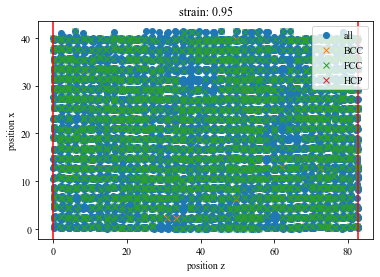

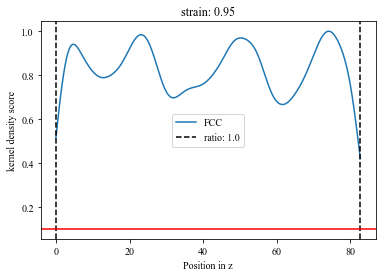

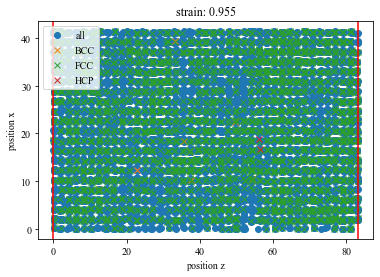

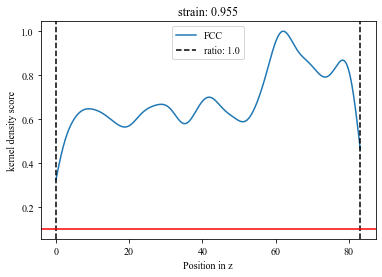

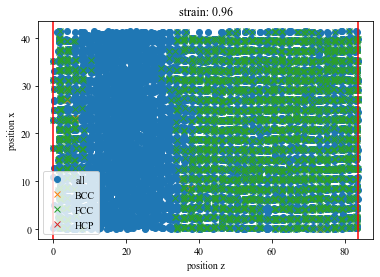

...

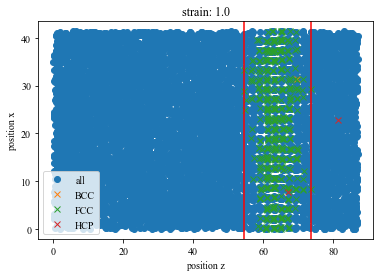

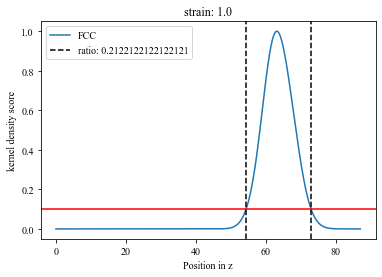

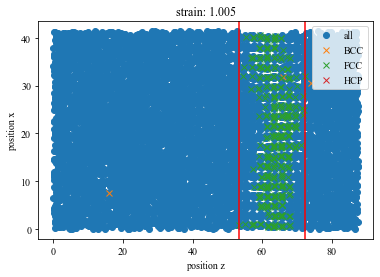

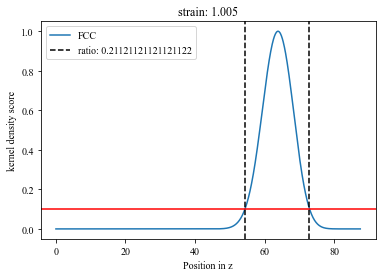

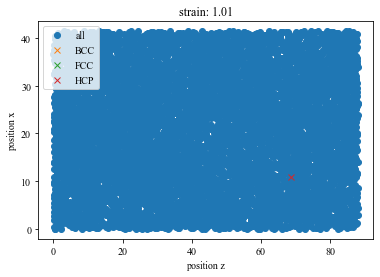

No handles with labels found to put in legend.


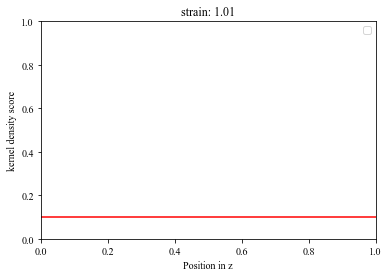

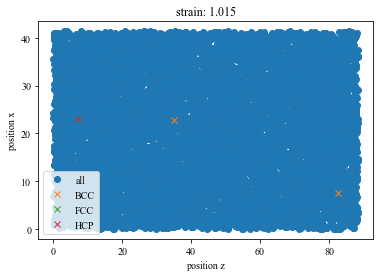

No handles with labels found to put in legend.


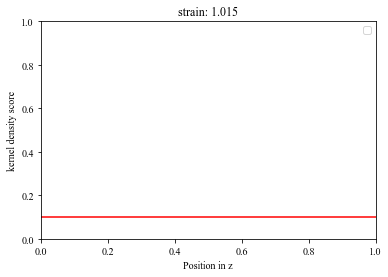

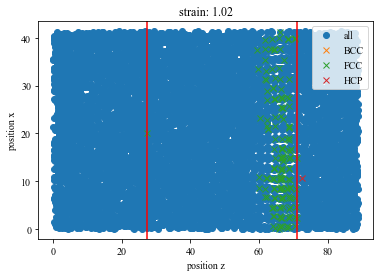

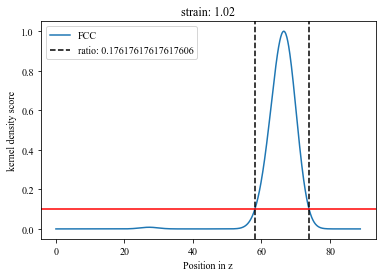

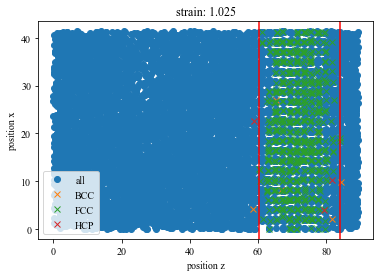

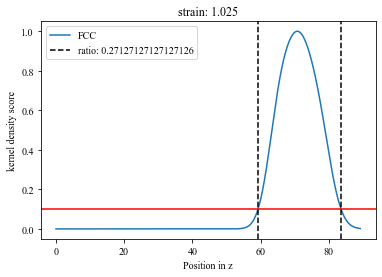

...

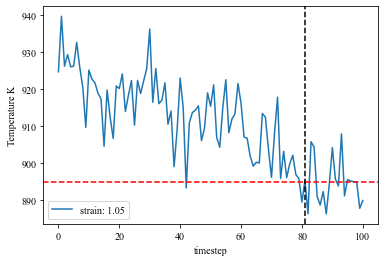

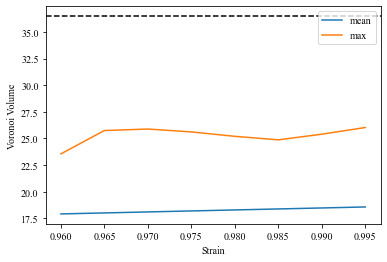

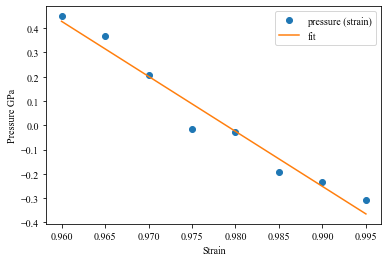

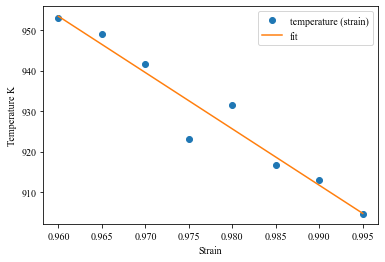

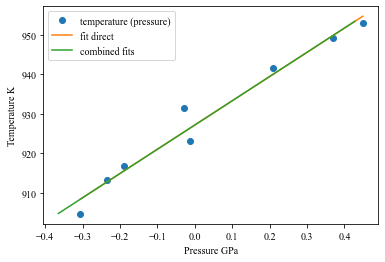

927.1449241225565 927.1429389605398


In [31]:
temperature_next, temperature_mean, temperature_left, temperature_right, strain_result_lst, pressure_result_lst = calc_temp_iteration(
        basis=ham_minimize_vol.get_structure().repeat([1,1,2]), 
        temperature_next=temperature_next, 
        project_parameter=project_parameter,
        timestep = timestep,
        nve_run_time_steps=nve_run_time_steps, 
        fit_range=fit_range,  
        center=None,
        debug_plot=True)

In [32]:
temperature_next, temperature_mean, temperature_left, temperature_right

(927.1449241225565, 928.7637099862527, 916.692734625292, 940.8346853472135)

# Step 3: run NVT and NVE MD

In [33]:
output = validate_convergence(
    pr=pr,
    temperature_left=temperature_left,
    temperature_next=temperature_next,
    temperature_right=temperature_right,
    enable_iteration=enable_iteration,
    timestep_iter=timestep_iter,
    timestep_lst=project_parameter['timestep_lst'],
    timestep=timestep,
    fit_range_iter=fit_range_iter,
    fit_range_lst=project_parameter['fit_range_lst'],
    fit_range=fit_range,
    nve_run_time_steps_iter=nve_run_time_steps_iter,
    nve_run_time_steps_lst=project_parameter['nve_run_time_steps_lst'],
    nve_run_time_steps=nve_run_time_steps,
    strain_result_lst=strain_result_lst,
    pressure_result_lst=pressure_result_lst,
    step_count=step_count,
    step_dict=step_dict,
    boundary_value=project_parameter['boundary_value'],
    ratio_boundary=project_parameter['ratio_boundary'],
    convergence_goal=project_parameter['convergence_criterion'],
    output_file=output_file
)
convergence_goal_achieved, enable_iteration, step_count, step_dict, timestep, fit_range, nve_run_time_steps, boundary_value, ratio_boundary, temperature_next, center = output

In [34]:
step_dict[step_count]

{'timestep': 2,
 'fit_range': 0.01,
 'nve_run_time_steps': 20000,
 'boundary_value': 0.25,
 'ratio_boundary': 0.25,
 'temperature_next': 927.1449241225565,
 'center': 0.98}

In [35]:
convergence_goal_achieved

False

# Step 4: full cycle, predict the final melting point

The job ham_npt_solid_927_14 was saved and received the ID: 56


The job ham_npt_liquid_high_1927_1399999999999 was saved and received the ID: 57


The job ham_npt_liquid_low_927_14 was saved and received the ID: 58


2020-12-02 19:52:50,274 - pyiron_log - WARNING - Job 'ham_nve_0_97_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_97_927_14_1 was saved and received the ID: 59


2020-12-02 19:55:33,569 - pyiron_log - WARNING - Job 'ham_nve_0_971_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_971_927_14_1 was saved and received the ID: 60


2020-12-02 19:58:18,953 - pyiron_log - WARNING - Job 'ham_nve_0_972_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_972_927_14_1 was saved and received the ID: 61


2020-12-02 20:01:00,974 - pyiron_log - WARNING - Job 'ham_nve_0_973_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_973_927_14_1 was saved and received the ID: 62


2020-12-02 20:03:43,177 - pyiron_log - WARNING - Job 'ham_nve_0_974_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_974_927_14_1 was saved and received the ID: 63


2020-12-02 20:06:25,786 - pyiron_log - WARNING - Job 'ham_nve_0_975_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_975_927_14_1 was saved and received the ID: 64


2020-12-02 20:09:07,635 - pyiron_log - WARNING - Job 'ham_nve_0_976_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_976_927_14_1 was saved and received the ID: 65


2020-12-02 20:11:55,227 - pyiron_log - WARNING - Job 'ham_nve_0_977_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_977_927_14_1 was saved and received the ID: 66


2020-12-02 20:14:36,264 - pyiron_log - WARNING - Job 'ham_nve_0_978_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_978_927_14_1 was saved and received the ID: 67


2020-12-02 20:17:16,968 - pyiron_log - WARNING - Job 'ham_nve_0_979_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_979_927_14_1 was saved and received the ID: 68


2020-12-02 20:19:55,718 - pyiron_log - WARNING - Job 'ham_nve_0_98_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_98_927_14_1 was saved and received the ID: 69


2020-12-02 20:22:23,867 - pyiron_log - WARNING - Job 'ham_nve_0_981_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_981_927_14_1 was saved and received the ID: 70


2020-12-02 20:24:51,327 - pyiron_log - WARNING - Job 'ham_nve_0_982_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_982_927_14_1 was saved and received the ID: 71


2020-12-02 20:27:10,472 - pyiron_log - WARNING - Job 'ham_nve_0_983_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_983_927_14_1 was saved and received the ID: 72


2020-12-02 20:29:28,601 - pyiron_log - WARNING - Job 'ham_nve_0_984_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_984_927_14_1 was saved and received the ID: 73


2020-12-02 20:31:43,372 - pyiron_log - WARNING - Job 'ham_nve_0_985_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_985_927_14_1 was saved and received the ID: 74


2020-12-02 20:34:00,692 - pyiron_log - WARNING - Job 'ham_nve_0_986_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_986_927_14_1 was saved and received the ID: 75


2020-12-02 20:36:17,079 - pyiron_log - WARNING - Job 'ham_nve_0_987_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_987_927_14_1 was saved and received the ID: 76


2020-12-02 20:38:27,392 - pyiron_log - WARNING - Job 'ham_nve_0_988_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_988_927_14_1 was saved and received the ID: 77


2020-12-02 20:40:45,921 - pyiron_log - WARNING - Job 'ham_nve_0_989_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_989_927_14_1 was saved and received the ID: 78


2020-12-02 20:42:59,766 - pyiron_log - WARNING - Job 'ham_nve_0_99_927_14_1' does not exist and cannot be loaded


The job ham_nvt_0_99_927_14_1 was saved and received the ID: 79


The job ham_nve_0_97_927_14_1 was saved and received the ID: 80


The job ham_nve_0_971_927_14_1 was saved and received the ID: 81


The job ham_nve_0_972_927_14_1 was saved and received the ID: 82


The job ham_nve_0_973_927_14_1 was saved and received the ID: 83


The job ham_nve_0_974_927_14_1 was saved and received the ID: 84


The job ham_nve_0_975_927_14_1 was saved and received the ID: 85


The job ham_nve_0_976_927_14_1 was saved and received the ID: 86


The job ham_nve_0_977_927_14_1 was saved and received the ID: 87


The job ham_nve_0_978_927_14_1 was saved and received the ID: 88


The job ham_nve_0_979_927_14_1 was saved and received the ID: 89


The job ham_nve_0_98_927_14_1 was saved and received the ID: 90


The job ham_nve_0_981_927_14_1 was saved and received the ID: 91


The job ham_nve_0_982_927_14_1 was saved and received the ID: 92


The job ham_nve_0_983_927_14_1 was saved and received the ID: 93


The job ham_nve_0_984_927_14_1 was saved and received the ID: 94


The job ham_nve_0_985_927_14_1 was saved and received the ID: 95


The job ham_nve_0_986_927_14_1 was saved and received the ID: 96


The job ham_nve_0_987_927_14_1 was saved and received the ID: 97


The job ham_nve_0_988_927_14_1 was saved and received the ID: 98


The job ham_nve_0_989_927_14_1 was saved and received the ID: 99


The job ham_nve_0_99_927_14_1 was saved and received the ID: 100


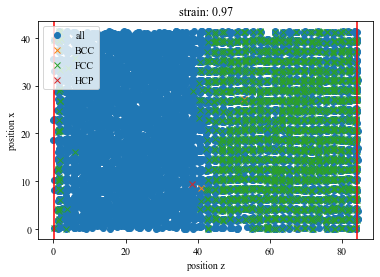

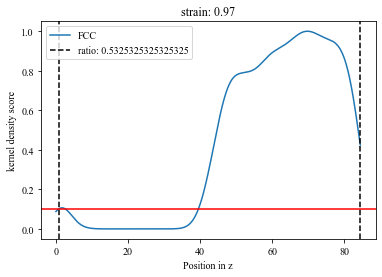

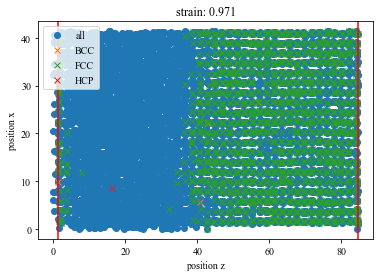

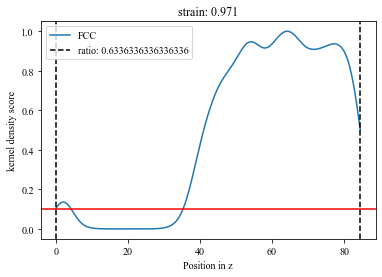

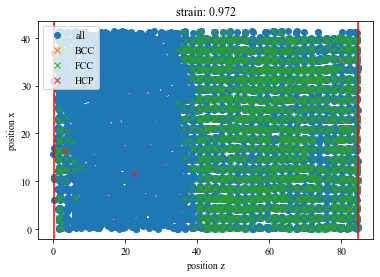

...

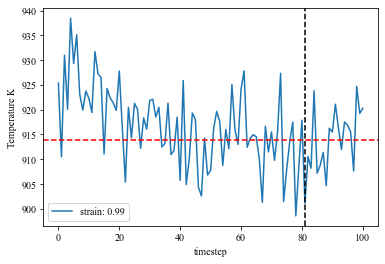

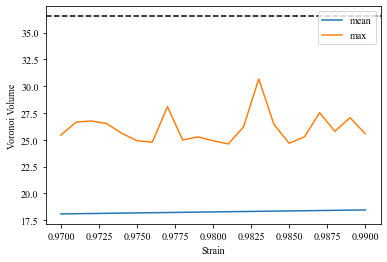

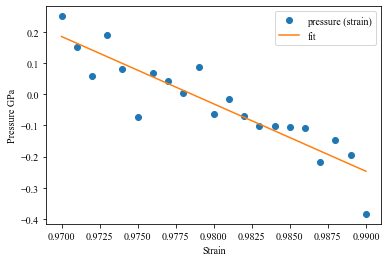

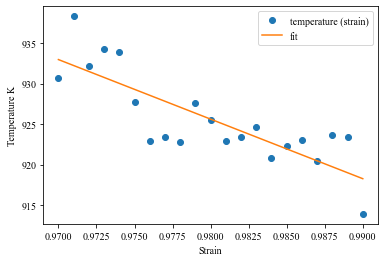

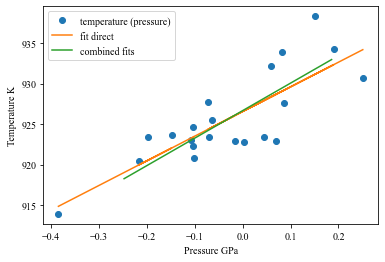

926.5512845384428 926.6596648867204
926.5512845384428 926.1133153523772 920.0115470652453 932.215083639509
{'timestep': 1, 'fit_range': 0.01, 'nve_run_time_steps': 50000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 926.5512845384428, 'center': 0.98}


The job ham_npt_solid_926_55 was saved and received the ID: 101


The job ham_npt_liquid_high_1926_55 was saved and received the ID: 102


The job ham_npt_liquid_low_926_55 was saved and received the ID: 103


2020-12-02 22:54:59,536 - pyiron_log - WARNING - Job 'ham_nve_0_97_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_97_926_55_2 was saved and received the ID: 104


2020-12-02 22:57:15,121 - pyiron_log - WARNING - Job 'ham_nve_0_971_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_971_926_55_2 was saved and received the ID: 105


2020-12-02 22:59:31,842 - pyiron_log - WARNING - Job 'ham_nve_0_972_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_972_926_55_2 was saved and received the ID: 106


2020-12-02 23:01:45,654 - pyiron_log - WARNING - Job 'ham_nve_0_973_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_973_926_55_2 was saved and received the ID: 107


2020-12-02 23:04:00,175 - pyiron_log - WARNING - Job 'ham_nve_0_974_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_974_926_55_2 was saved and received the ID: 108


2020-12-02 23:06:10,528 - pyiron_log - WARNING - Job 'ham_nve_0_975_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_975_926_55_2 was saved and received the ID: 109


2020-12-02 23:08:27,386 - pyiron_log - WARNING - Job 'ham_nve_0_976_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_976_926_55_2 was saved and received the ID: 110


2020-12-02 23:10:41,826 - pyiron_log - WARNING - Job 'ham_nve_0_977_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_977_926_55_2 was saved and received the ID: 111


2020-12-02 23:12:53,715 - pyiron_log - WARNING - Job 'ham_nve_0_978_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_978_926_55_2 was saved and received the ID: 112


2020-12-02 23:15:06,669 - pyiron_log - WARNING - Job 'ham_nve_0_979_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_979_926_55_2 was saved and received the ID: 113


2020-12-02 23:17:18,695 - pyiron_log - WARNING - Job 'ham_nve_0_98_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_98_926_55_2 was saved and received the ID: 114


2020-12-02 23:19:35,349 - pyiron_log - WARNING - Job 'ham_nve_0_981_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_981_926_55_2 was saved and received the ID: 115


2020-12-02 23:21:46,711 - pyiron_log - WARNING - Job 'ham_nve_0_982_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_982_926_55_2 was saved and received the ID: 116


2020-12-02 23:23:59,965 - pyiron_log - WARNING - Job 'ham_nve_0_983_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_983_926_55_2 was saved and received the ID: 117


2020-12-02 23:26:19,335 - pyiron_log - WARNING - Job 'ham_nve_0_984_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_984_926_55_2 was saved and received the ID: 118


2020-12-02 23:28:35,047 - pyiron_log - WARNING - Job 'ham_nve_0_985_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_985_926_55_2 was saved and received the ID: 119


2020-12-02 23:31:01,118 - pyiron_log - WARNING - Job 'ham_nve_0_986_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_986_926_55_2 was saved and received the ID: 120


2020-12-02 23:33:35,248 - pyiron_log - WARNING - Job 'ham_nve_0_987_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_987_926_55_2 was saved and received the ID: 121


2020-12-02 23:36:08,151 - pyiron_log - WARNING - Job 'ham_nve_0_988_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_988_926_55_2 was saved and received the ID: 122


2020-12-02 23:38:45,076 - pyiron_log - WARNING - Job 'ham_nve_0_989_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_989_926_55_2 was saved and received the ID: 123


2020-12-02 23:41:20,074 - pyiron_log - WARNING - Job 'ham_nve_0_99_926_55_2' does not exist and cannot be loaded


The job ham_nvt_0_99_926_55_2 was saved and received the ID: 124


The job ham_nve_0_97_926_55_2 was saved and received the ID: 125


The job ham_nve_0_971_926_55_2 was saved and received the ID: 126


The job ham_nve_0_972_926_55_2 was saved and received the ID: 127


The job ham_nve_0_973_926_55_2 was saved and received the ID: 128


The job ham_nve_0_974_926_55_2 was saved and received the ID: 129


The job ham_nve_0_975_926_55_2 was saved and received the ID: 130


The job ham_nve_0_976_926_55_2 was saved and received the ID: 131


The job ham_nve_0_977_926_55_2 was saved and received the ID: 132


The job ham_nve_0_978_926_55_2 was saved and received the ID: 133


The job ham_nve_0_979_926_55_2 was saved and received the ID: 134


The job ham_nve_0_98_926_55_2 was saved and received the ID: 135


The job ham_nve_0_981_926_55_2 was saved and received the ID: 136


The job ham_nve_0_982_926_55_2 was saved and received the ID: 137


The job ham_nve_0_983_926_55_2 was saved and received the ID: 138


The job ham_nve_0_984_926_55_2 was saved and received the ID: 139


The job ham_nve_0_985_926_55_2 was saved and received the ID: 140


The job ham_nve_0_986_926_55_2 was saved and received the ID: 141


The job ham_nve_0_987_926_55_2 was saved and received the ID: 142


The job ham_nve_0_988_926_55_2 was saved and received the ID: 143


The job ham_nve_0_989_926_55_2 was saved and received the ID: 144


The job ham_nve_0_99_926_55_2 was saved and received the ID: 145


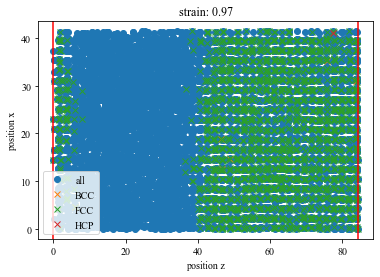

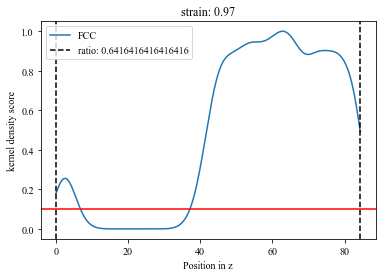

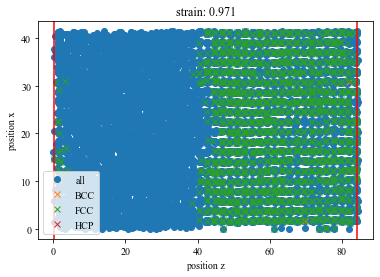

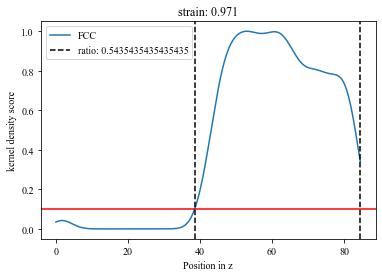

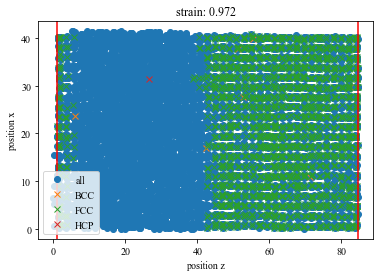

...

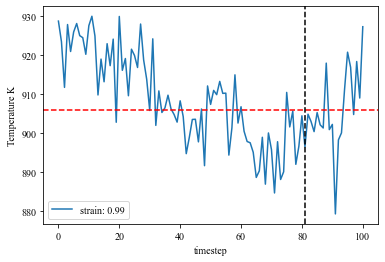

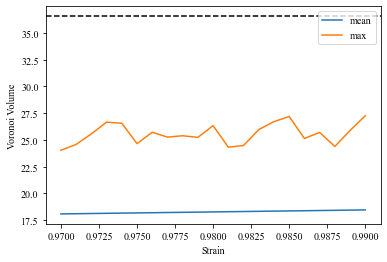

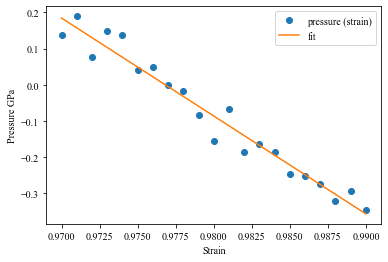

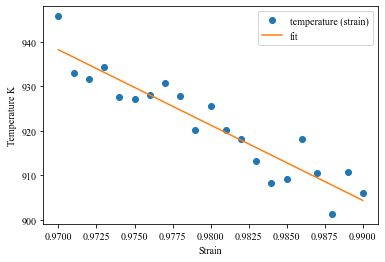

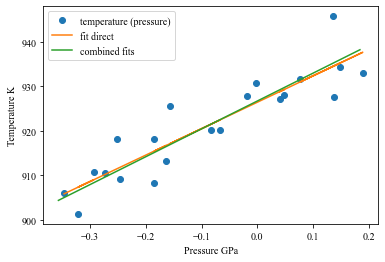

926.3889888521667 926.6669645597233
926.3889888521667 923.51455342346 912.4100359849392 934.6190708619807
{'timestep': 1, 'fit_range': 0.01, 'nve_run_time_steps': 50000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 926.3889888521667, 'center': 0.98}


The job ham_npt_solid_926_39 was saved and received the ID: 146


The job ham_npt_liquid_high_1926_3899999999999 was saved and received the ID: 147


The job ham_npt_liquid_low_926_39 was saved and received the ID: 148


2020-12-03 04:52:24,383 - pyiron_log - WARNING - Job 'ham_nve_0_97_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_97_926_39_2 was saved and received the ID: 149


2020-12-03 04:54:40,483 - pyiron_log - WARNING - Job 'ham_nve_0_971_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_971_926_39_2 was saved and received the ID: 150


2020-12-03 04:57:00,571 - pyiron_log - WARNING - Job 'ham_nve_0_972_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_972_926_39_2 was saved and received the ID: 151


2020-12-03 04:58:43,475 - pyiron_log - WARNING - Job 'ham_nve_0_973_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_973_926_39_2 was saved and received the ID: 152


2020-12-03 05:00:17,023 - pyiron_log - WARNING - Job 'ham_nve_0_974_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_974_926_39_2 was saved and received the ID: 153


2020-12-03 05:01:51,829 - pyiron_log - WARNING - Job 'ham_nve_0_975_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_975_926_39_2 was saved and received the ID: 154


2020-12-03 05:03:58,465 - pyiron_log - WARNING - Job 'ham_nve_0_976_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_976_926_39_2 was saved and received the ID: 155


2020-12-03 05:06:15,569 - pyiron_log - WARNING - Job 'ham_nve_0_977_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_977_926_39_2 was saved and received the ID: 156


2020-12-03 05:08:32,156 - pyiron_log - WARNING - Job 'ham_nve_0_978_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_978_926_39_2 was saved and received the ID: 157


2020-12-03 05:10:45,768 - pyiron_log - WARNING - Job 'ham_nve_0_979_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_979_926_39_2 was saved and received the ID: 158


2020-12-03 05:13:00,363 - pyiron_log - WARNING - Job 'ham_nve_0_98_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_98_926_39_2 was saved and received the ID: 159


2020-12-03 05:15:17,159 - pyiron_log - WARNING - Job 'ham_nve_0_981_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_981_926_39_2 was saved and received the ID: 160


2020-12-03 05:17:32,221 - pyiron_log - WARNING - Job 'ham_nve_0_982_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_982_926_39_2 was saved and received the ID: 161


2020-12-03 05:19:42,800 - pyiron_log - WARNING - Job 'ham_nve_0_983_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_983_926_39_2 was saved and received the ID: 162


2020-12-03 05:21:54,937 - pyiron_log - WARNING - Job 'ham_nve_0_984_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_984_926_39_2 was saved and received the ID: 163


2020-12-03 05:24:08,841 - pyiron_log - WARNING - Job 'ham_nve_0_985_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_985_926_39_2 was saved and received the ID: 164


2020-12-03 05:26:24,103 - pyiron_log - WARNING - Job 'ham_nve_0_986_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_986_926_39_2 was saved and received the ID: 165


2020-12-03 05:28:35,249 - pyiron_log - WARNING - Job 'ham_nve_0_987_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_987_926_39_2 was saved and received the ID: 166


2020-12-03 05:30:48,369 - pyiron_log - WARNING - Job 'ham_nve_0_988_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_988_926_39_2 was saved and received the ID: 167


2020-12-03 05:33:01,390 - pyiron_log - WARNING - Job 'ham_nve_0_989_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_989_926_39_2 was saved and received the ID: 168


2020-12-03 05:35:10,661 - pyiron_log - WARNING - Job 'ham_nve_0_99_926_39_2' does not exist and cannot be loaded


The job ham_nvt_0_99_926_39_2 was saved and received the ID: 169


The job ham_nve_0_97_926_39_2 was saved and received the ID: 170


The job ham_nve_0_971_926_39_2 was saved and received the ID: 171


The job ham_nve_0_972_926_39_2 was saved and received the ID: 172


The job ham_nve_0_973_926_39_2 was saved and received the ID: 173


The job ham_nve_0_974_926_39_2 was saved and received the ID: 174


The job ham_nve_0_975_926_39_2 was saved and received the ID: 175


The job ham_nve_0_976_926_39_2 was saved and received the ID: 176


The job ham_nve_0_977_926_39_2 was saved and received the ID: 177


The job ham_nve_0_978_926_39_2 was saved and received the ID: 178


The job ham_nve_0_979_926_39_2 was saved and received the ID: 179


The job ham_nve_0_98_926_39_2 was saved and received the ID: 180


The job ham_nve_0_981_926_39_2 was saved and received the ID: 181


The job ham_nve_0_982_926_39_2 was saved and received the ID: 182


The job ham_nve_0_983_926_39_2 was saved and received the ID: 183


The job ham_nve_0_984_926_39_2 was saved and received the ID: 184


The job ham_nve_0_985_926_39_2 was saved and received the ID: 185


The job ham_nve_0_986_926_39_2 was saved and received the ID: 186


The job ham_nve_0_987_926_39_2 was saved and received the ID: 187


The job ham_nve_0_988_926_39_2 was saved and received the ID: 188


The job ham_nve_0_989_926_39_2 was saved and received the ID: 189


The job ham_nve_0_99_926_39_2 was saved and received the ID: 190


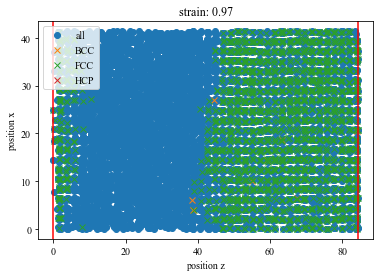

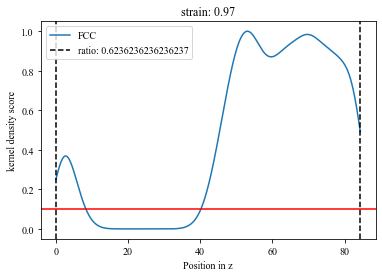

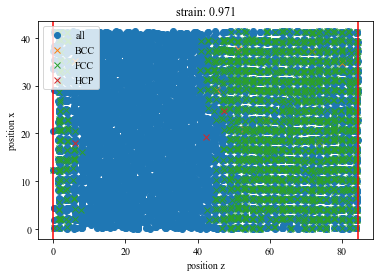

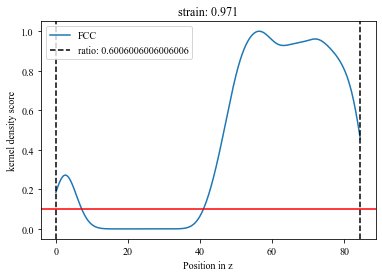

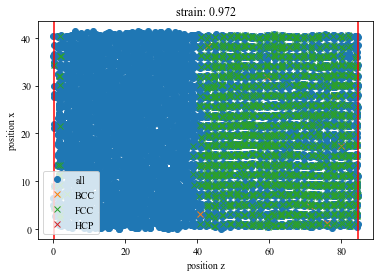

...

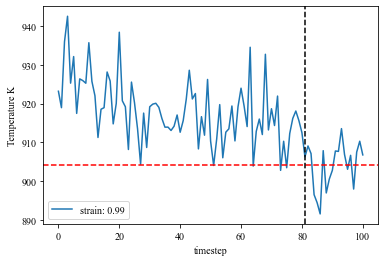

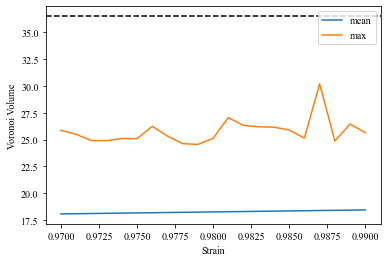

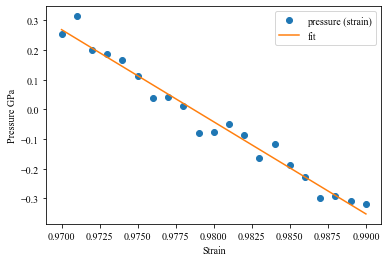

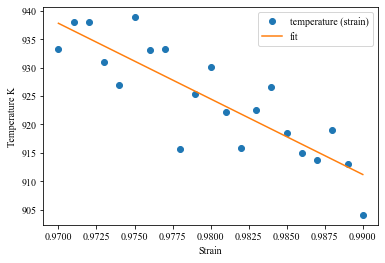

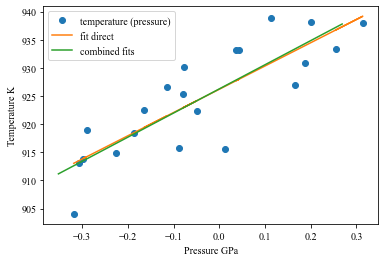

926.1964930924493 926.2617578274487
926.1964930924493 921.4498266213795 912.7483134186849 930.1513398240743
{'timestep': 1, 'fit_range': 0.01, 'nve_run_time_steps': 50000, 'boundary_value': 0.25, 'ratio_boundary': 0.25, 'temperature_next': 926.1964930924493, 'center': 0.98}


In [36]:
temperature_estimate_lst, temperature_calculated_lst = [], []
while len(temperature_calculated_lst) < 3 or not convergence_goal_achieved and len(temperature_calculated_lst) < 10:
    temperature_estimate_lst.append(temperature_next)
    temperature_next, temperature_mean, temperature_left, temperature_right, strain_result_lst, pressure_result_lst = calc_temp_iteration(
        basis=ham_minimize_vol.get_structure().repeat([1,1,2]), 
        temperature_next=temperature_next, 
        project_parameter=project_parameter,
        timestep=timestep,
        nve_run_time_steps=nve_run_time_steps, 
        fit_range=fit_range,  
        center=center,
        debug_plot=True)
    print(temperature_next, temperature_mean, temperature_left, temperature_right)
    output = validate_convergence(pr=pr,
                                  temperature_left=temperature_left, 
                                  temperature_next=temperature_next, 
                                  temperature_right=temperature_right, 
                                  enable_iteration=enable_iteration,
                                  timestep_iter=timestep_iter,
                                  timestep_lst=project_parameter['timestep_lst'],
                                  timestep=timestep,
                                  fit_range_iter=fit_range_iter, 
                                  fit_range_lst=project_parameter['fit_range_lst'], 
                                  fit_range=fit_range, 
                                  nve_run_time_steps_iter=nve_run_time_steps_iter, 
                                  nve_run_time_steps_lst=project_parameter['nve_run_time_steps_lst'], 
                                  nve_run_time_steps=nve_run_time_steps,
                                  strain_result_lst=strain_result_lst, 
                                  pressure_result_lst=pressure_result_lst, 
                                  step_count=step_count, 
                                  step_dict=step_dict, 
                                  boundary_value=project_parameter['boundary_value'], 
                                  ratio_boundary=project_parameter['ratio_boundary'],
                                  convergence_goal=project_parameter['convergence_criterion'],
                                  output_file=output_file)
    convergence_goal_achieved, enable_iteration, step_count, step_dict, timestep, fit_range, nve_run_time_steps, boundary_value, ratio_boundary, temperature_next, center = output
    print(step_dict[step_count])
    temperature_calculated_lst.append(temperature_next)

In [37]:
if not os.path.exists(output_file):
    with open(output_file, 'w') as f:
        json.dump(step_dict, f)

In [38]:
step_dict

{0: {'temperature_next': 930},
 1: {'timestep': 2,
  'fit_range': 0.01,
  'nve_run_time_steps': 20000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 927.1449241225565,
  'center': 0.98},
 2: {'timestep': 1,
  'fit_range': 0.01,
  'nve_run_time_steps': 50000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 926.5512845384428,
  'center': 0.98},
 3: {'timestep': 1,
  'fit_range': 0.01,
  'nve_run_time_steps': 50000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 926.3889888521667,
  'center': 0.98},
 4: {'timestep': 1,
  'fit_range': 0.01,
  'nve_run_time_steps': 50000,
  'boundary_value': 0.25,
  'ratio_boundary': 0.25,
  'temperature_next': 926.1964930924493,
  'center': 0.98}}

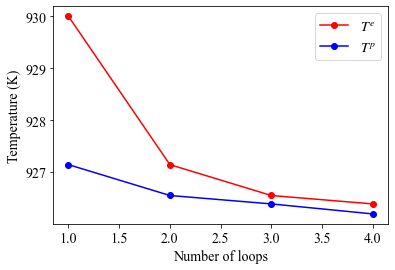

In [39]:
#plot the convergence of loop calculations
first_key = list(step_dict.keys())[-1]
second_key = 'temperature_next'
allt = [step_dict[key][second_key] for key in list(step_dict.keys())]
plt.plot(np.arange(1, len(allt)), allt[0:-1], 'ro-', label=r"$T^e$")
plt.plot(np.arange(1, len(allt)), allt[1:], 'bo-', label=r"$T^p$")
plt.legend(fontsize=14)
plt.tick_params(axis='both', labelsize=14)
plt.xlabel('Number of loops', fontsize=14)
plt.ylabel('Temperature (K)', fontsize=14)
plt.show()

In [40]:
df = pr.job_table()
df

,id,status,chemicalformula,job,subjob,projectpath,project,timestart,timestop,totalcputime,computer,hamilton,hamversion,parentid,masterid
0,1,finished,Al4000,minimize_pos,/minimize_pos,/scratch/janssen/melt_al/,melting/,2020-12-02 15:14:15.745819,2020-12-02 15:14:17.699103,1.0,pyiron@cmpc05#4,Lammps,0.1,NaN,None
1,2,finished,Al4000,minimize_vol,/minimize_vol,/scratch/janssen/melt_al/,melting/,2020-12-02 15:14:19.337331,2020-12-02 15:14:20.408460,1.0,pyiron@cmpc05#4,Lammps,0.1,NaN,None
2,3,finished,Al4000,temp_heating_1000,/temp_heating_1000,/scratch/janssen/melt_al/,melting/,2020-12-02 15:14:25.187128,2020-12-02 15:14:34.771869,9.0,pyiron@cmpc05#4,Lammps,0.1,NaN,None
3,4,finished,Al4000,temp_heating_500_0,/temp_heating_500_0,/scratch/janssen/melt_al/,melting/,2020-12-02 15:14:38.453354,2020-12-02 15:14:47.237087,8.0,pyiron@cmpc05#4,Lammps,0.1,NaN,None
4,5,finished,Al4000,temp_heating_750_0,/temp_heating_750_0,/scratch/janssen/melt_al/,melting/,2020-12-02 15:14:50.636243,2020-12-02 15:14:59.943079,9.0,pyiron@cmpc05#4,Lammps,0.1,NaN,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
185,186,finished,Al8000,ham_nve_0_986_926_39_2,/ham_nve_0_986_926_39_2,/scratch/janssen/melt_al/,melting/,2020-12-03 08:32:44.564599,2020-12-03 08:43:27.731589,643.0,pyiron@cmpc05#4,Lammps,0.1,165.0,None
186,187,finished,Al8000,ham_nve_0_987_926_39_2,/ham_nve_0_987_926_39_2,/scratch/janssen/melt_al/,melting/,2020-12-03 08:43:30.867721,2020-12-03 08:54:17.378757,646.0,pyiron@cmpc05#4,Lammps,0.1,166.0,None
187,188,finished,Al8000,ham_nve_0_988_926_39_2,/ham_nve_0_988_926_39_2,/scratch/janssen/melt_al/,melting/,2020-12-03 08:54:20.353834,2020-12-03 09:05:11.379423,651.0,pyiron@cmpc05#4,Lammps,0.1,167.0,None
188,189,finished,Al8000,ham_nve_0_989_926_39_2,/ham_nve_0_989_926_39_2,/scratch/janssen/melt_al/,melting/,2020-12-03 09:05:14.689941,2020-12-03 09:16:29.643552,674.0,pyiron@cmpc05#4,Lammps,0.1,168.0,None
